# scRNA-Seq Analysis of DLBCL_Tumor_Cell_States

In [1]:
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import gc

print("All libraries are successfully imported")

All libraries are successfully imported


In [2]:
sc.settings.set_figure_params(dpi=50, facecolor="white")

In [3]:
results_file = "results/dlbcl.h5ad"

In [4]:
# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.24.3 scipy==1.11.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 igraph==0.11.5 pynndescent==0.5.12


In [5]:
# Load the raw count matrix into an AnnData object
adata_matrix = sc.read_text("data/raw/GSE182434_raw_count_matrix.txt")

# Load the cell annotation file into a Dataframe
annotations = pd.read_csv("data/raw/GSE182434_cell_annotation.txt", sep="\t")

In [6]:
print(adata_matrix)
print(annotations)

AnnData object with n_obs × n_vars = 49632 × 28416
                               ID   Patient     Sample     CellType  \
0      AAACCTGAGTTAAGTG_DLBCL002B  DLBCL002  DLBCL002B      B cells   
1      AAACCTGCATGTAAGA_DLBCL002B  DLBCL002  DLBCL002B      B cells   
2      AAACCTGTCGCGCCAA_DLBCL002B  DLBCL002  DLBCL002B      B cells   
3      AAACGGGAGACTTTCG_DLBCL002B  DLBCL002  DLBCL002B      B cells   
4      AAACGGGCATGTTGAC_DLBCL002B  DLBCL002  DLBCL002B      B cells   
...                           ...       ...        ...          ...   
28411       TTTGTCACATGGGAAC_T2NB        T2       T2NB          TFH   
28412       TTTGTCACATGGTCTA_T2NB        T2       T2NB  T cells CD4   
28413       TTTGTCAGTAAGTTCC_T2NB        T2       T2NB          TFH   
28414       TTTGTCAGTGACTCAT_T2NB        T2       T2NB  T cells CD4   
28415       TTTGTCATCTGATTCT_T2NB        T2       T2NB        Tregs   

      TumorNormal  COO  Tissue  
0          Normal  ABC   DLBCL  
1           Tumor  ABC   DLBCL

In [7]:
# Transpose data (swap rows and columns) (In case n_obs in AnnDATA object don't match the rows in the cell annotations DataFrame)
adata = adata_matrix.transpose()

# Ensure that the cell names/IDs match in both adata object and the cell annotation
assert all(adata.obs_names == annotations["ID"].values), "Cell Types do not match"

In [8]:

# Ensure the cells are unique all through
adata.obs_names_make_unique()

# Add the annotations to the AnnData object
adata.obs = annotations

adata.to_df()

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.5,AL627309.4,AP006222.2,AL732372.1,...,AP001469.5,AP001469.7,AP001469.9,AC136352.5,AC136352.4,AC171558.2,BX004987.4,AC145212.4,AC145212.2,FAM231B
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28411,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28412,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28413,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28414,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Quality Control

In [9]:
# Calculate proportions of counts for specific gene population
# Mitochondrial genes, "MT-"
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# Ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith("RPS", "RPL")

In [10]:
# The scanpy function calculates quality control metrics, in this case the proportions of counts for the mitochondrial and ribosomal gene populations
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo"], inplace=True, log1p=True)

/home/eaderogba279/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


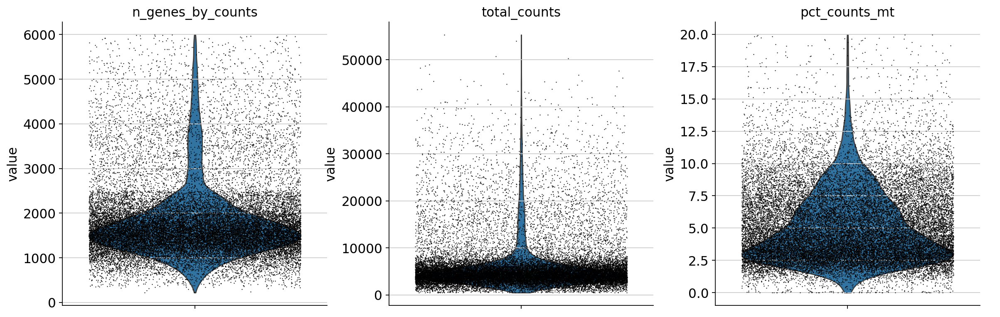

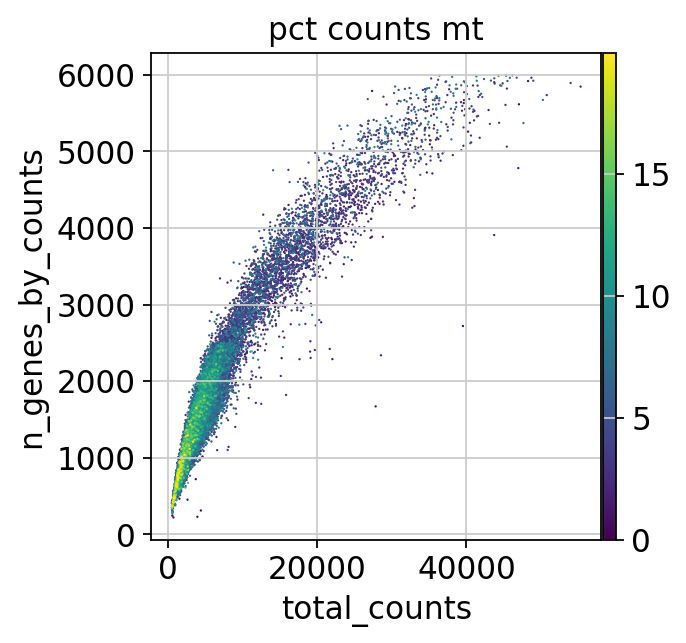

In [11]:
# Violin plots of some of the computed quality QC metrics:
# The number of genes expressed in the count matrix
# The total counts per cell
# The percentage of counts in mitochondrial genes

sc.pl.violin(adata, ["n_genes_by_counts", "total_counts", "pct_counts_mt"], jitter=0.4, multi_panel=True)

# Joint QC metrics visualisation using a scatter plot
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

/home/eaderogba279/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


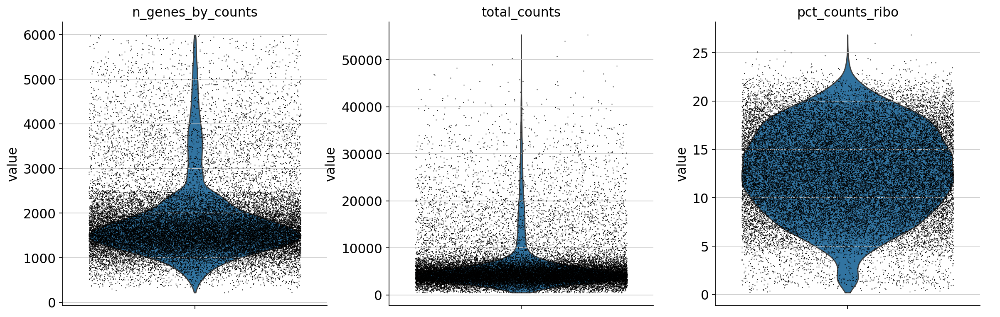

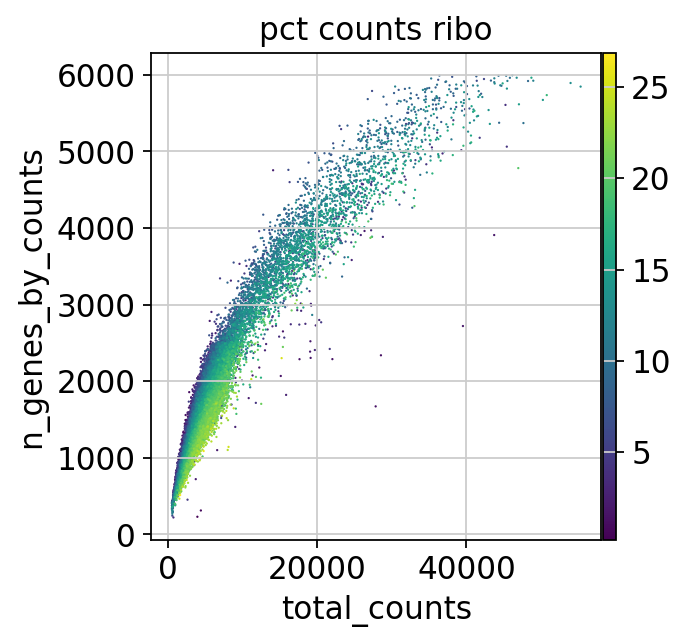

In [12]:
# The percentage of counts in ribosomal genes
sc.pl.violin(adata, ["n_genes_by_counts", "total_counts", "pct_counts_ribo"], jitter=0.4, multi_panel=True)

# Joint QC metrics visualisation using a scatter plot
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_ribo")

## Preprocessing

normalizing counts per cell
    finished (0:00:19)


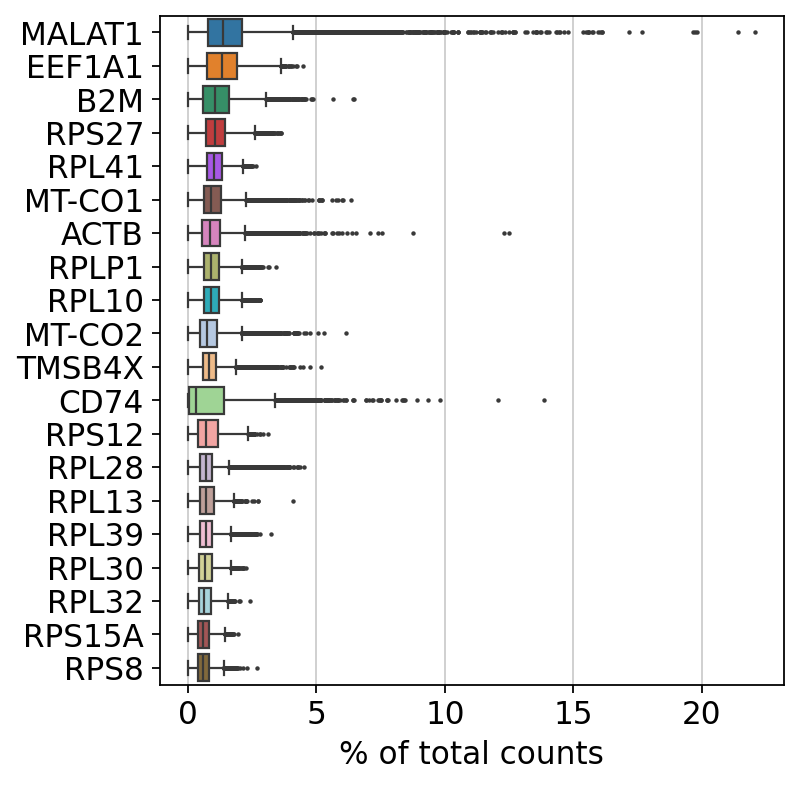

In [13]:
# Show genes that yield the highest fraction of counts in each single cell, across all cells
sc.pl.highest_expr_genes(adata, n_top=20)

In [14]:
# Basic Filtering
# Remove cells that have fewer than 200 genes
sc.pp.filter_cells(adata, min_genes=200)

# Remove genes that are expressed in fewer than 3 cells
sc.pp.filter_genes(adata, min_cells=3)

/home/eaderogba279/anaconda3/lib/python3.11/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


filtered out 23376 genes that are detected in less than 3 cells


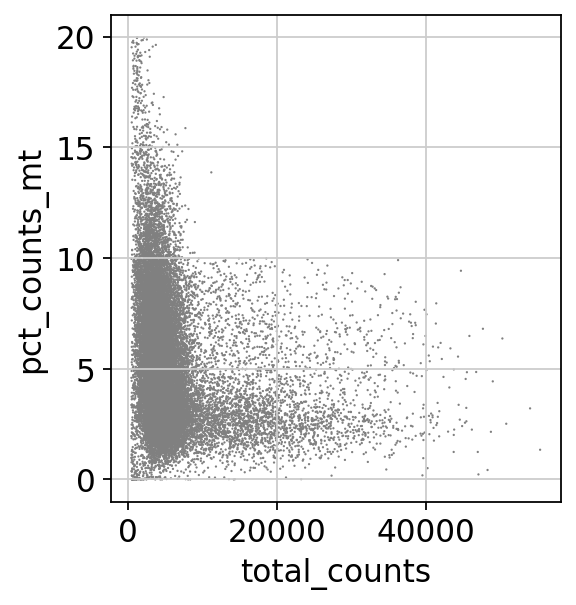

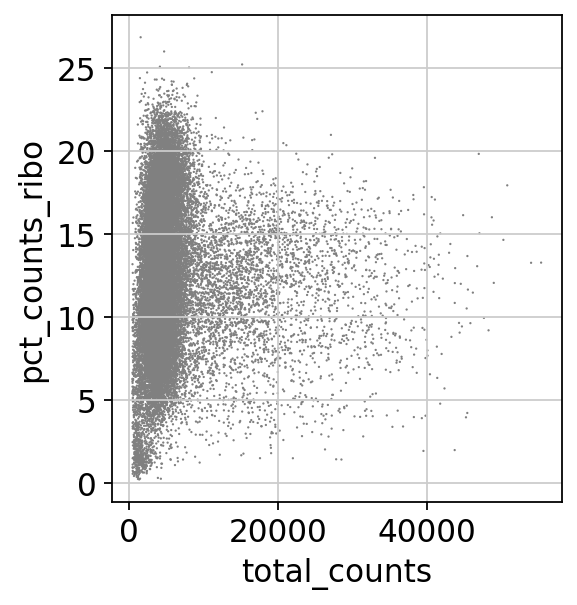

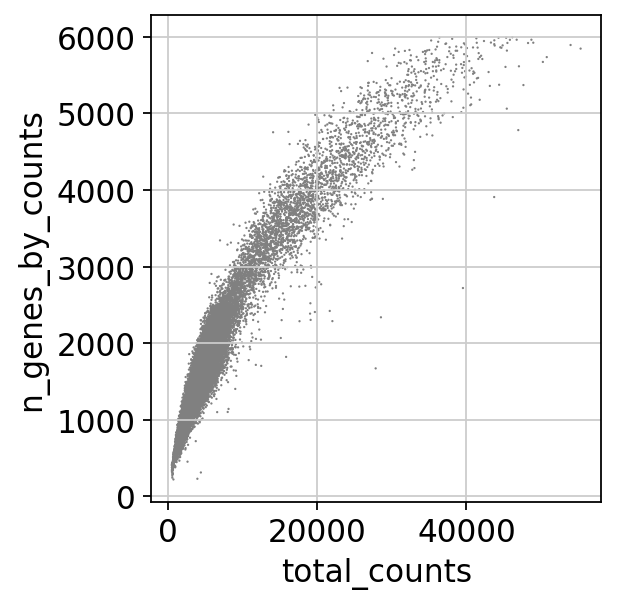

In [15]:

# Visulaise the total_counts to percentage of mt_counts and gene_counts per cell 
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="pct_counts_ribo")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts")

In [16]:
# Additional filtering on the adata object
# Filter out cells that have equal to or more than 2500 genes detected
adata = adata[adata.obs.n_genes_by_counts < 2500, :]

# Filter out cells that have more than 5% mitochondrial gene contents
adata = adata[adata.obs.pct_counts_mt < 5, :].copy()

#### Doublet Detection

In [17]:
# Run doublet detection to remove cells with two or more cell types
sc.pp.scrublet(adata, batch_key="Sample")

Running Scrublet
filtered out 13865 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    using data matrix X directly
Automatically set threshold at doublet score = 0.18
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 35.8%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 0.0%
filtered out 10997 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (ada

### Normalization

In [18]:
# Saving count data
adata.layers["counts"] = adata.X.copy()

In [19]:
# Normalizing to median total counts (to ensure counts become comparable among cells)
sc.pp.normalize_total(adata)

# Logarithmize the data
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


#### Feature Selection

In [21]:
# Identify highly variable gense
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="Sample")

extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


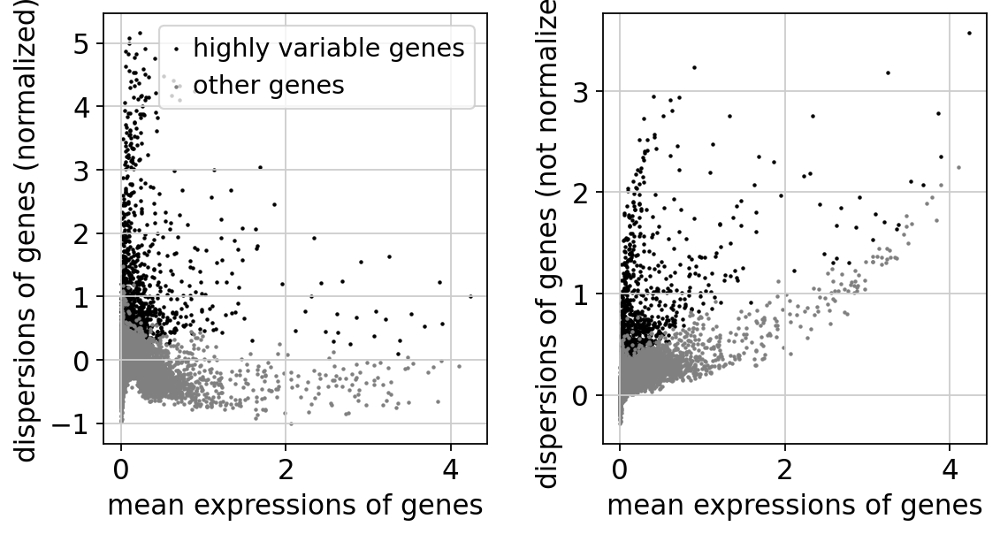

In [22]:
# Visulaise the results of the highly variable genes
sc.pl.highly_variable_genes(adata)

### Dimensionality Reduction

In [23]:
# Reduce the dimensionality of the data by running PCA
sc.tl.pca(adata)

computing PCA
    with n_comps=50
    finished (0:00:01)


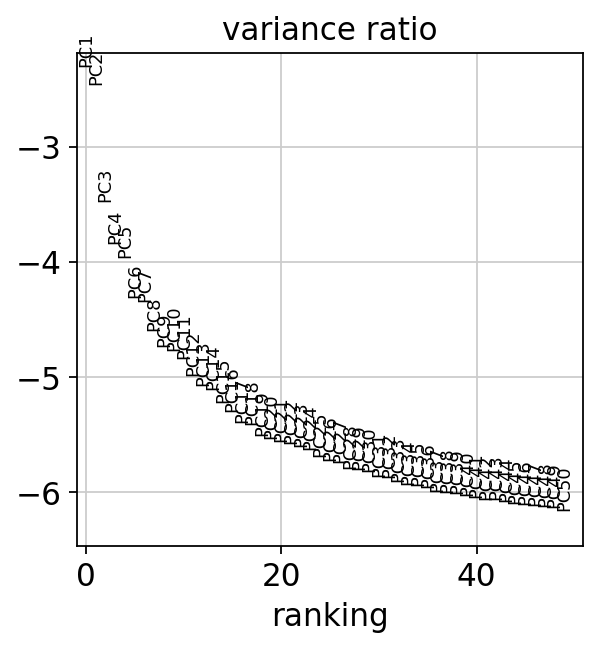

In [24]:
# Inspect the contributions of single PCs to the total variance of the data
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

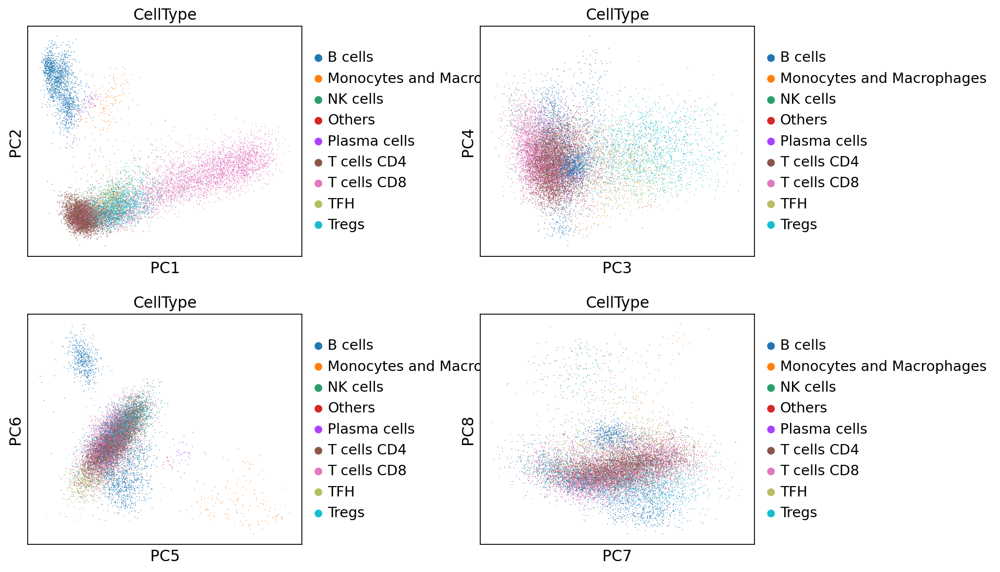

In [38]:
# Visulaise the PCs using specified dimensions
sc.pl.pca(
    adata,
    color=["CellType", "CellType", "CellType", "CellType"],
    dimensions=[(0, 1), (2, 3), (4, 5), (6, 7)],
    ncols=2,
    wspace=0.5,
    size=2,
)

#### Nearest Neighbour Graph Construction and Visualisation

In [30]:
# Compute the neighbourhood graph of cells using the PCA representation of the data matrix
sc.pp.neighbors(adata)

# Embedding the graph in 2D using UMAP
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


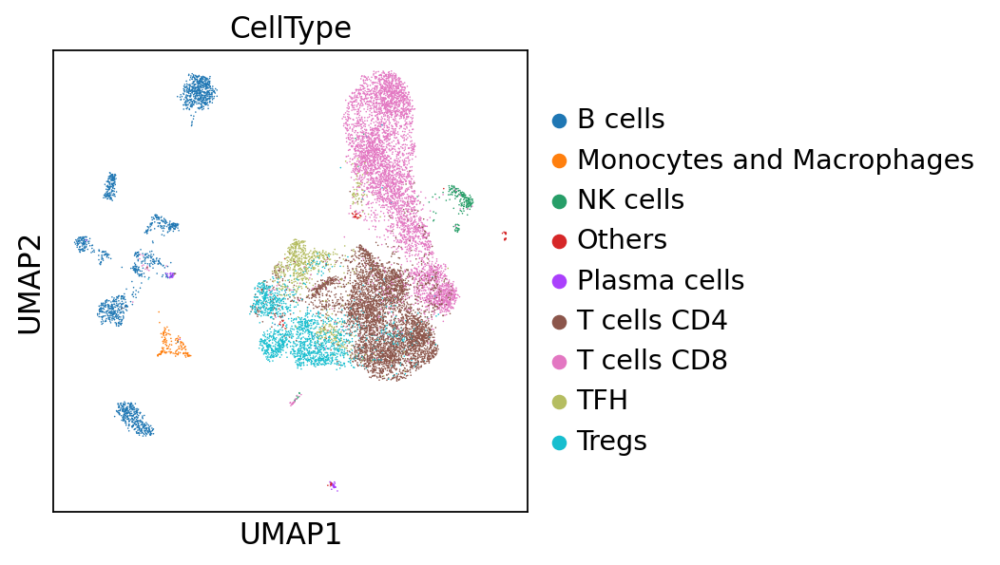

In [34]:
# Visualise the UMAP according to the cell types
sc.pl.umap(
    adata,
    color="CellType",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

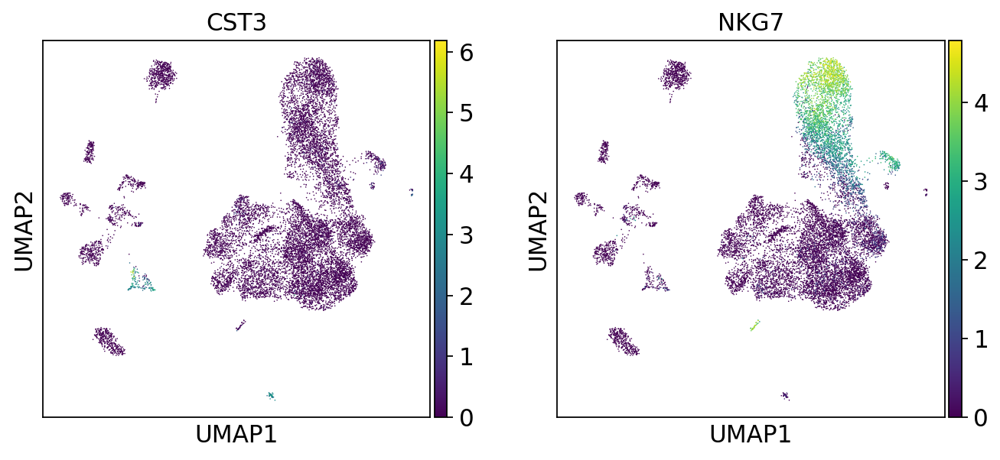

In [42]:
sc.pl.umap(
    adata,
    color=["CST3","NKG7"],
    # Setting a smaller point size to get prevent overlap
    size=2,
)

#### Clustering

In [35]:
# Utilising the Leiden graph-clustering method
# Using the igraph implementation and a fixed number of iterations can be significantly faster, especially for larger datasets
sc.tl.leiden(adata, flavor="igraph", n_iterations=2)

running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


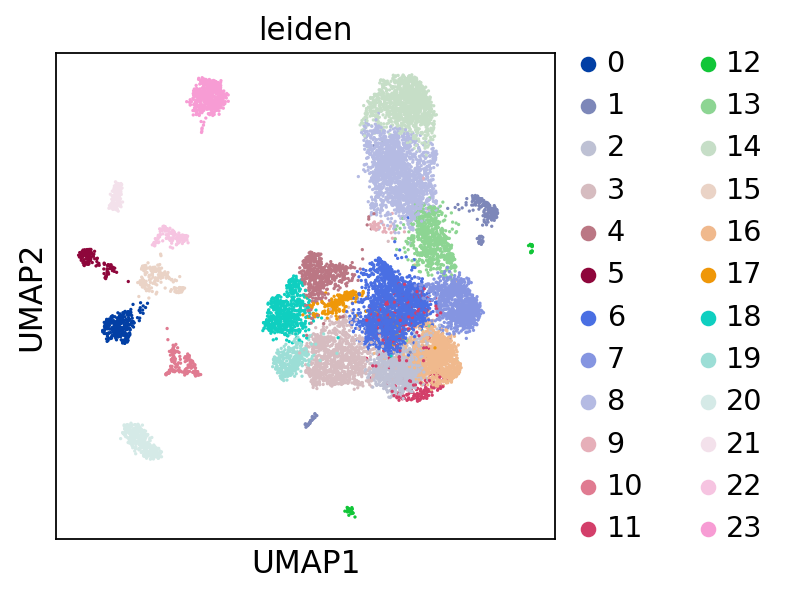

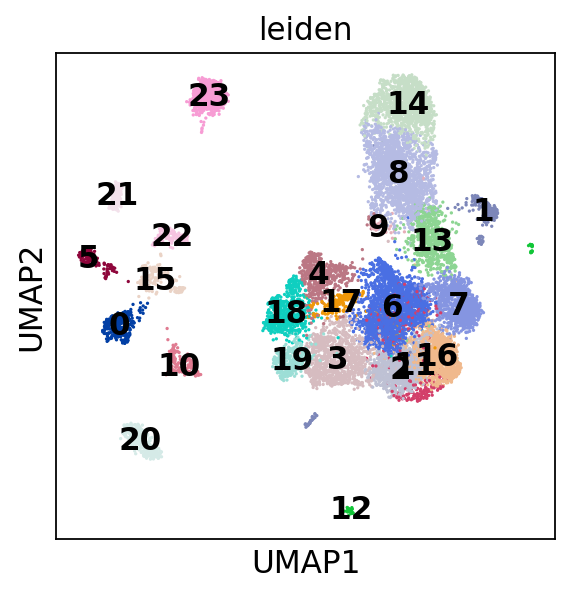

In [44]:
# Visualise the clustering using the clustring resluts generated from the Leiden algorithm
sc.pl.umap(adata, color=["leiden"])
sc.pl.umap(adata, color=["leiden"], legend_loc="on data")

#### Re-assess quality control and cell filtering

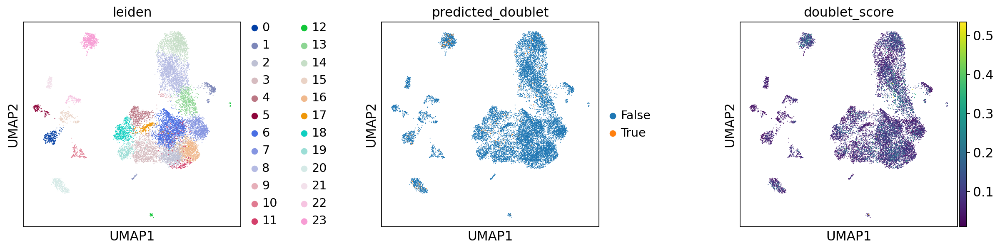

In [37]:
# Re-assess the quality control and cell filtering process
sc.pl.umap(
    adata,
    color=["leiden", "predicted_doublet", "doublet_score"],
    # increase horizontal space between panels
    wspace=0.5,
    size=3,
)

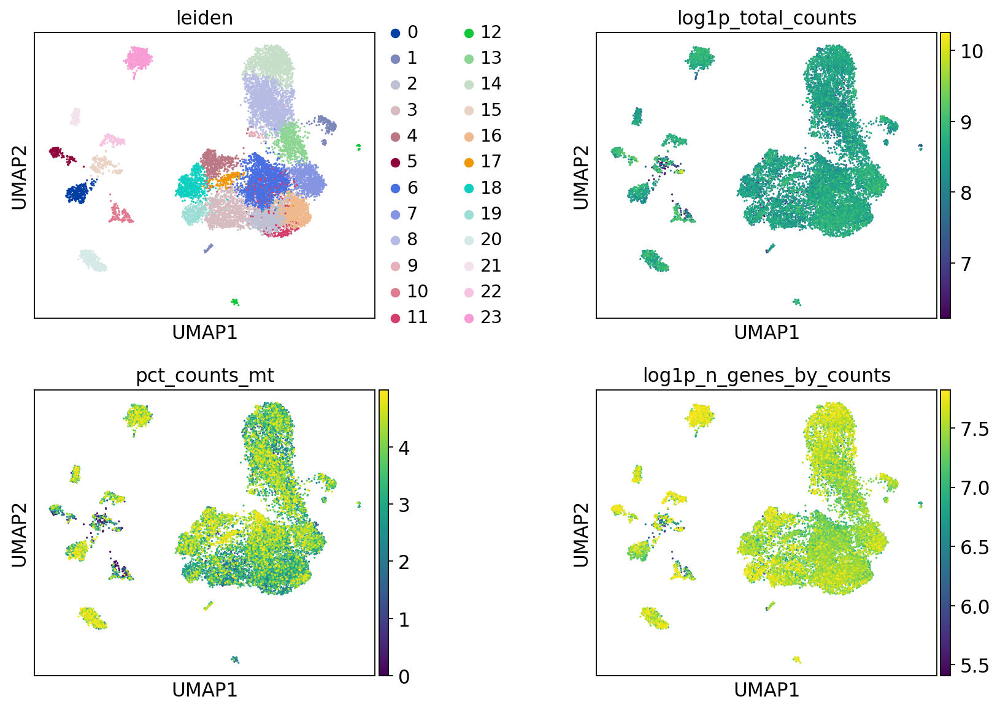

In [39]:
sc.pl.umap(
    adata,
    color=["leiden", "log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2,
)

#### Finding Marker Genes

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:25)


/home/eaderogba279/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/eaderogba279/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/eaderogba279/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:434: PerformanceWarning: DataF

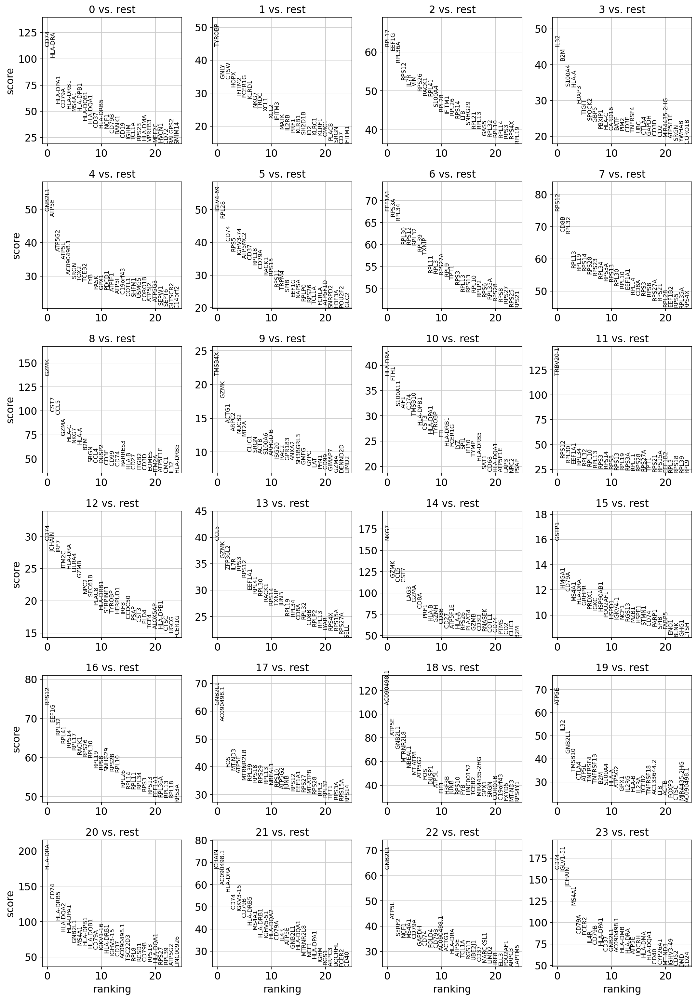

In [52]:
# Compute a ranking for the highly differential genes in each cluster using t-test
sc.tl.rank_genes_groups(adata, groupby="leiden", method="t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:49)


/home/eaderogba279/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/eaderogba279/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/eaderogba279/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:434: PerformanceWarning: DataF

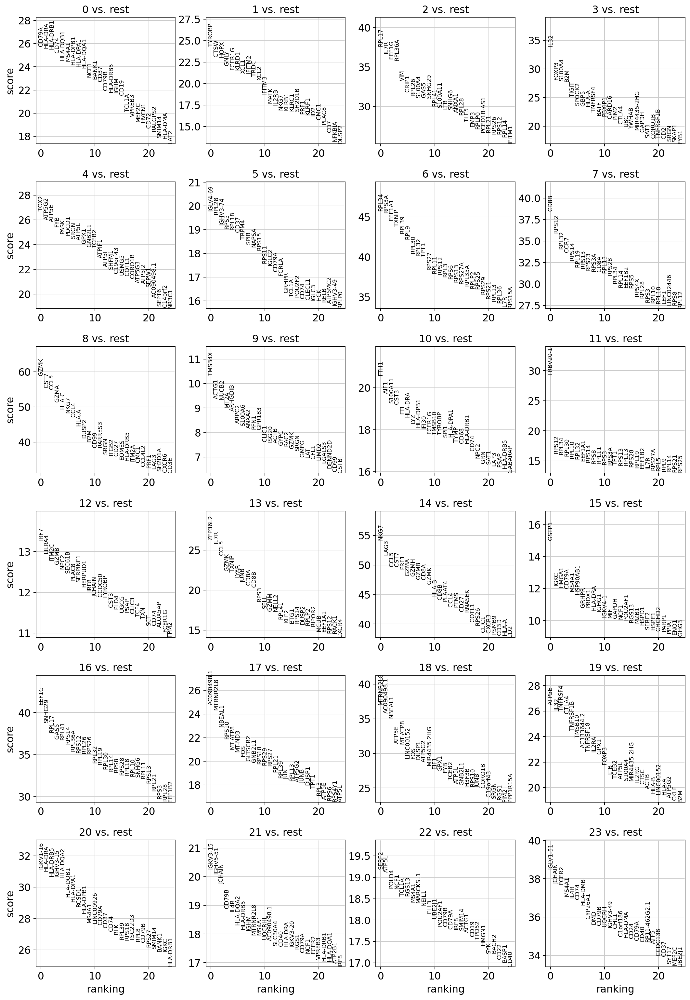

In [53]:
# Compute a ranking for the highly differential genes in each cluster using wilcoxon
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [55]:
# Save the result
adata.write(results_file)

In [82]:
# Define a list of marker genes
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    # Note: DMXL2 should be negative
    "cDC2": ["CST3", "COTL1", "LYZ", "DMXL2", "CLEC10A", "FCER1A"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    # Note HBM and GYPA are negative markers
    "Proerythroblast": ["CDK6", "SYNGR1"],
    "NK": ["GNLY", "NKG7", "CD247", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    # Note IGHD and IGHM are negative markers
    "B cells": [
        "MS4A1",
        "ITGB1",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
    ],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    # Note PAX5 is a negative marker
    "Plasmablast": ["XBP1", "PRDM1", "PAX5"],
    "CD4+ T": ["CD4", "IL7R", "TRBC2"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
}

In [81]:
# Reload the object that has been saved with the Wilcoxon Rank-Sum test result
adata = sc.read(results_file)

In [76]:
# Show the top 10 ranked genes per cluster
pd.DataFrame(adata.uns["rank_genes_groups"]["names"]).head(10)

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,CD79A,TYROBP,RPL17,IL32,TOX2,IGLV4-69,RPL34,CD8B,GZMK,TMSB4X,...,NKG7,GSTP1,EEF1G,AC090498.1,MTRNR2L8,ATP5E,IGKV1-16,IGKV3-15,SERF2,IGLV1-51
1,HLA-DRA,CTSW,IL7R,FOXP3,ATP5G2,RPL28,RPS3A,RPS12,CST7,ACTG1,...,LAG3,IGKC,SNHG29,MTRNR2L8,AC090498.1,IL32,HLA-DRA,IGHV5-51,ATP5L,JCHAIN
2,HLA-DRB1,HOPX,EEF1G,S100A4,ATP5E,IGHV3-74,EEF1A1,RPL32,CCL5,NUCB2,...,CCL5,HMGA1,RPL17,NBEAL1,NBEAL1,TNFRSF4,HLA-DRB5,JCHAIN,POLD4,FCER2
3,CD74,GNLY,RPL36A,B2M,FYB,RPS5,TXNIP,CCR7,GZMA,MT2A,...,CST7,CD79A,GAS5,RPS10,ATP5E,CTLA4,IGHV3-15,CD79B,NCF1,MS4A1
4,HLA-DQB1,FCER1G,VIM,TIGIT,PASK,RPL18,RPL39,RPS14,HLA-C,ARHGDIB,...,PRF1,MS4A1,RPL41,MT-ATP8,MT-ATP8,TNFRSF1B,HLA-DQA2,IL4R,TCL1A,IL4R
5,MS4A1,KLRD1,CRIP1,SPOCK2,PDCD1,CD37,RPL9,RPL19,NKG7,ARPC2,...,GZMA,HSP90AB1,RPS14,MT-ND3,LINC00152,TMSB10,HLA-DQB1,HLA-DQA2,RGS13,CD74
6,HLA-DPB1,XCL1,RPL26,GBP5,SRGN,TRPM4,RPL30,RPS13,CCL4,S100A6,...,GZMH,GRHPR,RPL36A,FOS,FOS,AC133644.2,HLA-DPA1,HLA-DRB5,MS4A1,HLA-DMB
7,HLA-DPA1,IFITM2,S100A4,HLA-A,ATP5L,SPIB,RPL32,RPS23,HLA-A,ANXA2,...,GZMB,PRDX1,RPS12,GLTSCR2,DUSP1,TNFRSF18,RCSD1,IGHM,MARCKSL1,CYP26A1
8,HLA-DQA1,TRDC,GAS5,TNFRSF4,GPX1,NAPSA,TPT1,RPS3A,DUSP2,PFN1,...,CD8A,HLA-DRA,RPL26,GNB2L1,ATP5G2,IL2RA,HLA-DPB1,MTRNR2L8,NEIL1,DMD
9,NCF1,XCL2,SNHG29,BATF,GNB2L1,RPS15,RPS27,CD8A,B2M,GPR183,...,GZMK,IGHG1,RPS26,RPS18,MIR4435-2HG,GPX1,MS4A1,MS4A1,ELL3,CD79B


In [77]:
# Get a table with the scores and groups
result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
pd.DataFrame(
    {
        group + "_" + key[:1]: result[key][group]
        for group in groups
        for key in ["names", "pvals"]
    }
).head(10)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,19_n,19_p,20_n,20_p,21_n,21_p,22_n,22_p,23_n,23_p
0,CD79A,3.246718e-146,TYROBP,1.060391e-130,RPL17,2.403282e-309,IL32,3.208259e-252,TOX2,3.059411e-157,...,ATP5E,1.024615e-154,IGKV1-16,6.030247e-213,IGKV3-15,2.860545e-91,SERF2,4.660539e-82,IGLV1-51,0.000000e+00
1,HLA-DRA,1.933792e-144,CTSW,4.026209e-118,IL7R,5.865831e-295,FOXP3,2.422558e-173,ATP5G2,5.077470e-149,...,IL32,4.827635e-150,HLA-DRA,5.651424e-211,IGHV5-51,8.016706e-90,ATP5L,1.839178e-81,JCHAIN,0.000000e+00
2,HLA-DRB1,1.555076e-143,HOPX,2.384309e-117,EEF1G,1.468677e-283,S100A4,5.673445e-172,ATP5E,2.446615e-147,...,TNFRSF4,4.692818e-149,HLA-DRB5,1.093860e-206,JCHAIN,7.013794e-87,POLD4,2.132019e-78,FCER2,0.000000e+00
3,CD74,4.873567e-140,GNLY,2.924212e-108,RPL36A,4.160086e-280,B2M,9.839354e-170,FYB,1.420508e-142,...,CTLA4,7.635343e-147,IGHV3-15,1.959098e-206,CD79B,1.367913e-79,NCF1,2.826536e-78,MS4A1,7.348823e-301
4,HLA-DQB1,5.156227e-133,FCER1G,1.364793e-103,VIM,4.077897e-242,TIGIT,1.791305e-139,PASK,1.564958e-136,...,TNFRSF1B,3.202445e-132,HLA-DQA2,1.845033e-205,IL4R,1.181585e-78,TCL1A,6.793082e-77,IL4R,2.152784e-299
5,MS4A1,3.606477e-132,KLRD1,3.002316e-103,CRIP1,8.487205e-222,SPOCK2,6.204781e-124,PDCD1,7.395436e-135,...,TMSB10,3.583200e-126,HLA-DQB1,2.041723e-189,HLA-DQA2,5.937241e-75,RGS13,7.232557e-77,CD74,2.537587e-298
6,HLA-DPB1,4.966865e-129,XCL1,9.483181e-100,RPL26,5.267405e-215,GBP5,2.805594e-122,SRGN,1.630007e-132,...,AC133644.2,2.844350e-118,HLA-DPA1,1.553984e-185,HLA-DRB5,1.286921e-73,MS4A1,1.002240e-75,HLA-DMB,1.313937e-293
7,HLA-DPA1,4.647568e-127,IFITM2,1.333049e-99,S100A4,1.416483e-212,HLA-A,2.586285e-121,ATP5L,2.980584e-131,...,TNFRSF18,2.486647e-115,RCSD1,1.201824e-181,IGHM,2.189049e-73,MARCKSL1,1.265328e-75,CYP26A1,3.370942e-282
8,HLA-DQA1,4.736198e-126,TRDC,1.842631e-96,GAS5,2.940841e-212,TNFRSF4,7.863919e-112,GPX1,3.787891e-128,...,IL2RA,7.093127e-115,HLA-DPB1,3.406568e-176,MTRNR2L8,3.723756e-72,NEIL1,4.558398e-75,DMD,7.208855e-278
9,NCF1,4.417852e-118,XCL2,2.581031e-92,SNHG29,2.702274e-211,BATF,1.413940e-105,GNB2L1,2.594263e-125,...,GPX1,2.311779e-113,MS4A1,4.861938e-169,MS4A1,4.173541e-72,ELL3,1.078574e-73,CD79B,5.338452e-277


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


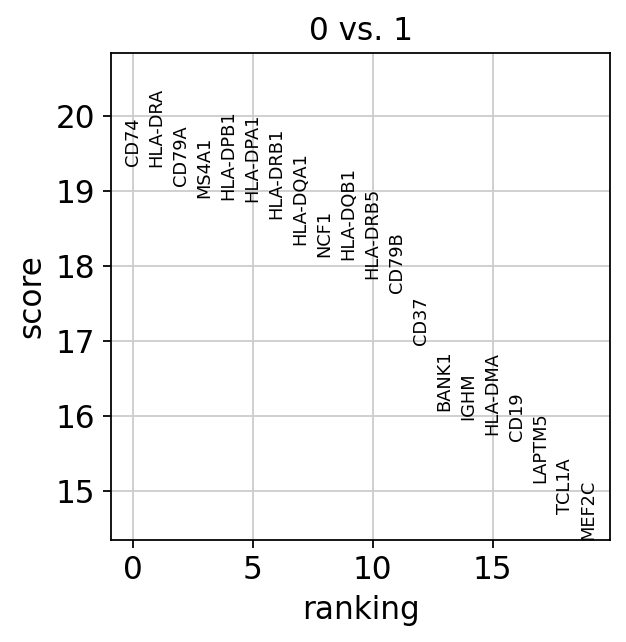

In [63]:
# Compare to a single cluster
sc.tl.rank_genes_groups(adata, "leiden", groups=["0"], reference="1", method="wilcoxon")
sc.pl.rank_genes_groups(adata, groups=["0"], n_genes=20)

/home/eaderogba279/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


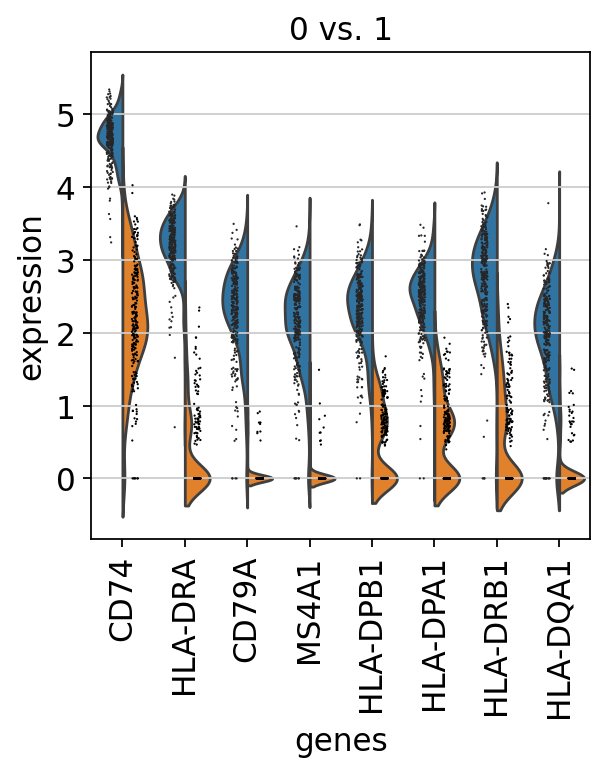

In [64]:
sc.pl.rank_genes_groups_violin(adata, groups="0", n_genes=8)

/home/eaderogba279/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/__init__.py:1303: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


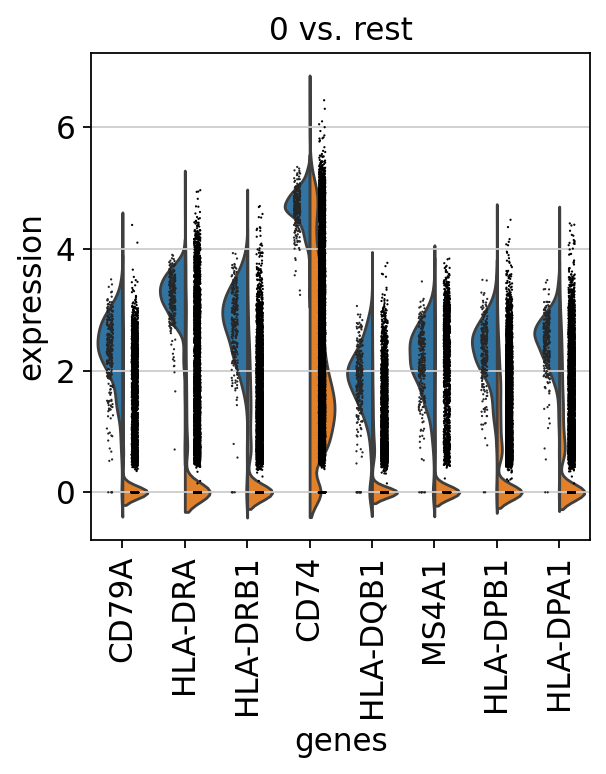

In [70]:
# Reload the object with the computed differential expresiion
#adata = sc.read(results_file)
sc.pl.rank_genes_groups_violin(adata, groups="0", n_genes=8)

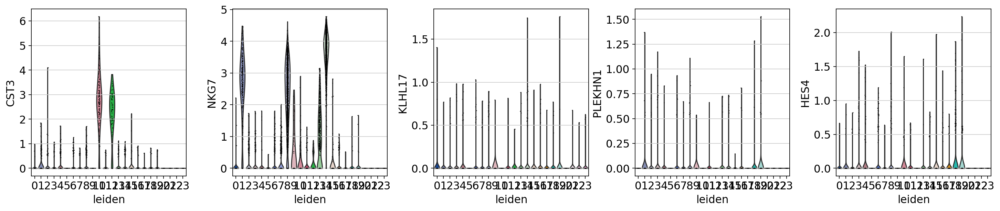

In [84]:
# To compare a certain gene across groups
sc.pl.violin(adata, ["CST3", "NKG7", "KLHL17", "PLEKHN1", "HES4"], groupby="leiden")

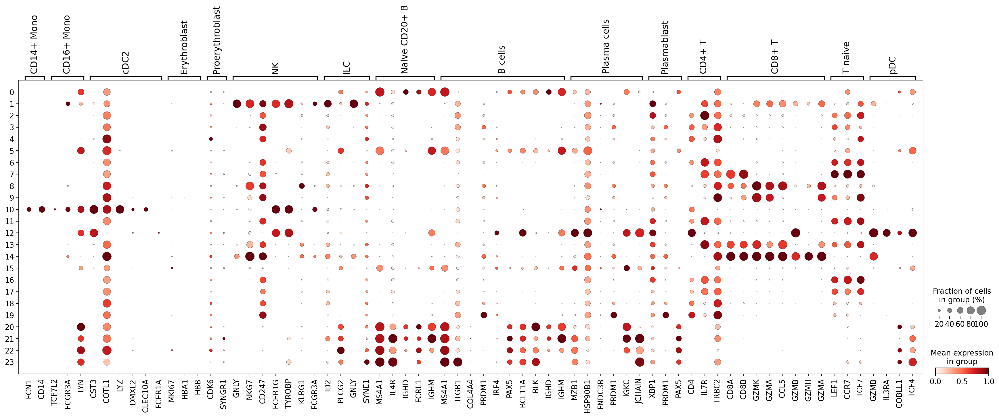

In [83]:
# Dot plot visualisation of gene expression across clusters
sc.pl.dotplot(adata, marker_genes, groupby="leiden", standard_scale="var")

#### Differentially Expressed Genes as Markers

In [85]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:30)


/home/eaderogba279/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/eaderogba279/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/eaderogba279/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:434: PerformanceWarning: DataF

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


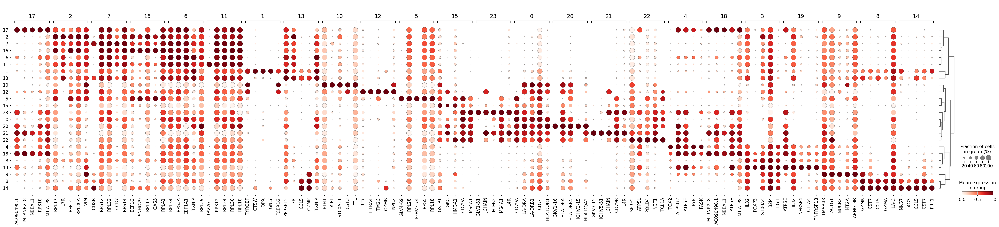

In [86]:
# Visualise the top 5 differentially-expressed genes on a dotplot
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden", standard_scale="var", n_genes=5)

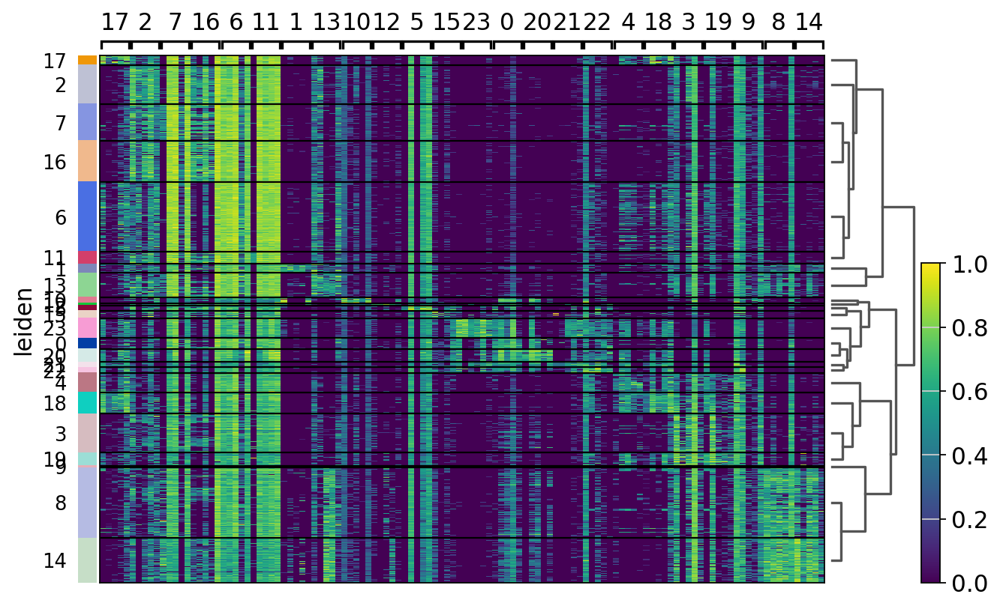

In [93]:
sc.pl.rank_genes_groups_heatmap(adata, groupby="leiden", standard_scale="var", n_genes=5)

In [87]:
# More automated approach
sc.get.rank_genes_groups_df(adata, group="7").head(5)

,names,scores,logfoldchanges,pvals,pvals_adj
0,CD8B,38.482491,3.046873,0.000000e+00,0.000000e+00
1,RPS12,35.915989,1.009173,1.719608e-282,2.257501e-278
2,RPL32,34.066441,0.805992,2.317380e-254,2.028171e-250
3,CCR7,33.685760,2.217491,9.344327e-249,6.133616e-245
4,RPS14,32.715366,0.794483,9.444015e-235,4.959241e-231


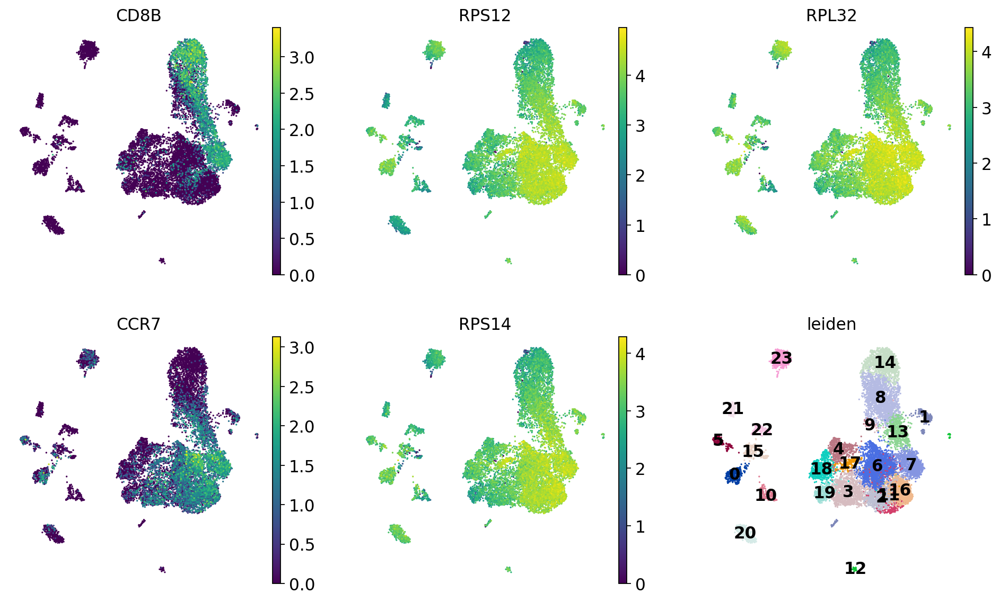

In [89]:
dc_cluster_genes = sc.get.rank_genes_groups_df(adata, group="7").head(5)["names"]
sc.pl.umap(
    adata,
    color=[*dc_cluster_genes, "leiden"],
    legend_loc="on data",
    frameon=False,
    ncols=3,
)

In [90]:
adata

AnnData object with n_obs × n_vars = 13621 × 26256
    obs: 'ID', 'Patient', 'Sample', 'CellType', 'TumorNormal', 'COO', 'Tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CellType_colors', 'Sample_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'predicted_doublet_colors', 'rank_genes_groups', 'scrublet', 'umap', 'dendrogram_leiden'
 

In [91]:
# `compression='gzip'` saves disk space, and slightly slows down writing and subsequent reading
adata.write(results_file, compression="gzip")